In [50]:
%matplotlib notebook
%matplotlib inline

In [51]:
from matplotlib import cm
import numpy as np
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d.axes3d as p3
import matplotlib.animation as animation
import scipy.optimize as so
import pickle

from matplotlib import animation, rc
from IPython.display import HTML
plt.rcParams["animation.html"] = "jshtml"

import import_ipynb
import benchmarks

In [52]:
def load_bees_positions(file_name):
    with open("../tests/abc/positions/" + file_name, "rb") as fp:
        x_best_bee, y_best_bee, x_empl, y_empl, x_onlook, y_onlook = pickle.load(fp)
    return x_best_bee, y_best_bee, x_empl, y_empl, x_onlook, y_onlook

In [53]:
def animation_of_bees(fig, ax, file_name, save_gif=False):
    x_b, y_b, x_e, y_e, x_o, y_o = load_bees_positions(file_name)

    plot_colors, markers = ["orangered", "black", "#064413"], ["D", "X", "."]
    lines = []
    lines_data_x, lines_data_y = x_b + x_e + x_o, y_b + y_e + y_o

    line = ax.plot([], [], marker=markers[0], color=plot_colors[0])[0]  # for best bee
    lines.append(line)
    for bee in range(len(x_e)):
        line = ax.plot([], [], marker=markers[1], color=plot_colors[1])[0]  # for employed bees
        lines.append(line)
    for bee in range(len(x_o)):
        line = ax.plot([], [], marker=markers[2], color=plot_colors[2])[0]  # for onlooker bees
        lines.append(line)

    def init():
        for line in lines:
            line.set_data([], [])
        return lines

    def animate(i):
        for l, line in enumerate(lines):
            line.set_data(lines_data_x[l][i], lines_data_y[l][i])  # get bee, get current point
        return lines

    frames = len(lines_data_x[0])
    interval = int(8000/frames)
    anim = animation.FuncAnimation(fig, animate, init_func=init, frames=frames, interval=interval,
                                   blit=True, repeat=False)

    if save_gif:
        plt.tight_layout()
        anim.save('./tests/abc/' + file_name[:-4] + '.gif', writer='imagemagick', fps=60)

    return anim

In [61]:
def animation_rastrigin(file_name, anim_f, fig):
    ax = fig.add_subplot(1, 2, 1, projection='3d')

    X = np.linspace(-5.12, 5.12, 100)
    Y = np.linspace(-5.12, 5.12, 100)
    X, Y = np.meshgrid(X, Y)

    Z = (X ** 2 - 10 * np.cos(2 * np.pi * X)) + \
        (Y ** 2 - 10 * np.cos(2 * np.pi * Y)) + 20

    surf = ax.plot_surface(X, Y, Z, rstride=5, cstride=5, linewidth=0, cmap=cm.summer)  # 3D

    ax = fig.add_subplot(1, 2, 2)
    c = plt.contourf(X, Y, Z, 10, cmap=cm.summer)  # 2D

    circle_small = plt.Circle((0, 0), 0.05, color='k')  # center - optimum
    circle_big = plt.Circle((0, 0), 0.35, color='k', fill=False)
    ax.add_artist(circle_small)
    ax.add_artist(circle_big)

    anim = anim_f(fig, ax, file_name)

    plt.tight_layout()
#     plt.draw()
#     plt.show()
    return anim

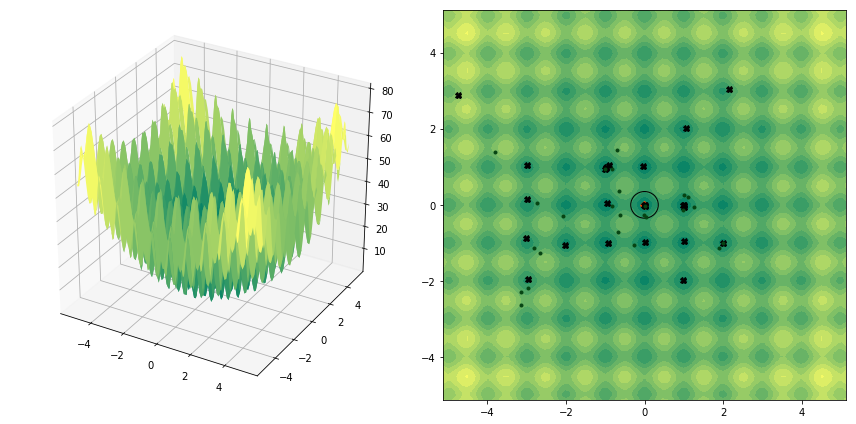

In [63]:
file_name = 'Rastrigin_25-25_bees_in_100iterations_50limit_0.4neighbourhood.txt'
fig = plt.figure(figsize=(12, 6))
anim = animation_rastrigin(file_name, animation_of_bees, fig)
HTML(anim.to_jshtml())
# anim